In [2]:
# Import relevant modules

# Linear Algebra and Science Modules
import numpy as np
import pandas as pd 
import scipy as sp 

# Machine Learning Modules
import sklearn as sk
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Deep Learning Modules
import torch
import torch.nn.functional as F
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
from diffusers import UNet2DModel
from diffusers import DDPMScheduler
from diffusers import DDPMPipeline
from diffusers.utils import make_image_grid
from accelerate import Accelerator
from huggingface_hub import create_repo, upload_folder
from accelerate import notebook_launcher


# Visualisation Tools
import matplotlib.pyplot as plt 
import seaborn as sns
from PIL import Image
%matplotlib inline 

# File Loader
import h5py 
import os
from tqdm.auto import tqdm
from pathlib import Path

# Hugging face applications
from huggingface_hub import notebook_login
from dataclasses import dataclass

In [3]:
"""The Code below adapts the diffusion model basic training tutorial avaliable at https://huggingface.co/docs/diffusers/tutorials/basic_training, https://huggingface.co/docs/diffusers/using-diffusers/write_own_pipeline
for the purpose of creating a diffusion model for cyclone data"""

'The Code below adapts the diffusion model basic training tutorial avaliable at https://huggingface.co/docs/diffusers/tutorials/basic_training, https://huggingface.co/docs/diffusers/using-diffusers/write_own_pipeline\nfor the purpose of creating a diffusion model for cyclone data'

In [4]:
notebook_login()

In [48]:
@dataclass
class TrainingConfig:
    image_size = 128
    train_batch_size = 16
    eval_batch_size = 16
    num_epochs = 50
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_warmup_steps = 500
    save_image_epochs = 10
    save_model_epochs = 10
    mixed_precision = "fp16"
    output_dir = "ddpm-Cyclones-128"

    push_to_hub = True
    hub_model_id = "InquisitorNovaCycloneStudy_4"
    hub_private_repo = True
    overwrite_output_dir = True
    seed = 0
config = TrainingConfig()

In [49]:
data_path = r"C:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\Machine Learning Personal Projects\Cyclone Imaging\Cyclone h5 Dataset\Cyclone_Images.h5"
# load "Images" as numpy ndarray, this could take a long time
with h5py.File(data_path, 'r') as hf:
    Cyclone_Images = hf['Images'][:,:,:,:3]

In [50]:
# Image Augmentation:
Cyclone_Images = np.nan_to_num(Cyclone_Images)
Cyclone_Images.min(), Cyclone_Images.max()

# Rescale
Cyclone_Images = 2*(Cyclone_Images)/255.0 - 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


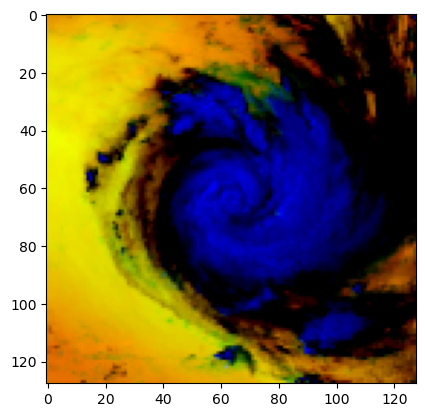

In [51]:
plt.imshow(Cyclone_Images[3000], cmap = "gray")

In [52]:
Cyclone_Images = np.transpose(Cyclone_Images, (0, 3, 1, 2))
Cyclone_Images = torch.Tensor(Cyclone_Images)

In [53]:
Cyclone_Images.shape

torch.Size([21076, 3, 128, 128])

In [54]:
# create dataloader
Cyclone_Images = torch.Tensor(Cyclone_Images)
train_dataloader = DataLoader(Cyclone_Images, batch_size=config.train_batch_size, shuffle=True)

In [55]:
# Implement the Unconditional Diffusion Model
model = UNet2DModel(
    sample_size = config.image_size,
    in_channels=3,
    out_channels=3,
    layers_per_block=2,
    block_out_channels=(64,128,128,256,256,512,512),
    down_block_types = (
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",
        "AttnDownBlock2D",
        "DownBlock2D",
    ),
    up_block_types = 
    (   
        "UpBlock2D",
        "AttnUpBlock2D",
        "AttnUpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
    downsample_type = "resnet"
)

In [56]:
sample_image = Cyclone_Images[3000].unsqueeze(0)
print("Input shape:", sample_image.shape)

Input shape: torch.Size([1, 3, 128, 128])


In [57]:
print("Output shape:", model(sample_image, timestep=0).sample.shape)

Output shape: torch.Size([1, 3, 128, 128])


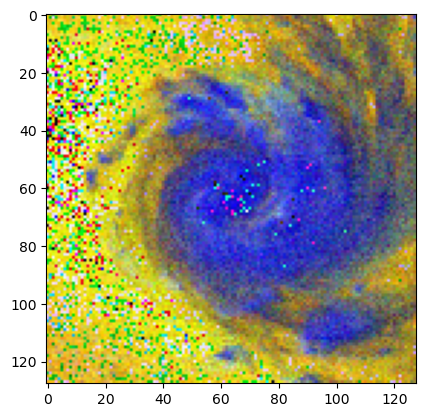

In [58]:
noise_scheduler = DDPMScheduler(num_train_timesteps=2000)
noise = torch.randn(sample_image.shape)
timesteps = torch.LongTensor([50])
noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)
plt.imshow(((noisy_image.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0], cmap = "gray")

In [59]:
noise_pred = model(noisy_image, timesteps).sample
loss = F.mse_loss(noise_pred, noise)
loss

tensor(1.0574, grad_fn=<MseLossBackward0>)

In [60]:
from diffusers.optimization import get_cosine_schedule_with_warmup

optimizer = torch.optim.AdamW(model.parameters(), lr=config.learning_rate)
lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=config.lr_warmup_steps,
    num_training_steps=(len(train_dataloader) * config.num_epochs),
)

In [61]:
def evaluate(config, epoch, pipeline):
    # Sample some images from random noise (this is the backward diffusion process).
    # The default pipeline output type is `List[PIL.Image]`
    images = pipeline(
        batch_size=config.eval_batch_size,
        generator=torch.manual_seed(config.seed),
    ).images

    # Make a grid out of the images
    image_grid = make_image_grid(images, rows=4, cols=4)

    # Save the images
    test_dir = os.path.join(config.output_dir, "samples")
    os.makedirs(test_dir, exist_ok=True)
    image_grid.save(f"{test_dir}/{epoch:04d}.png")

In [62]:
torch.manual_seed(config.seed)

In [63]:
def train_loop(config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler):
    # Initialize accelerator and tensorboard logging
    accelerator = Accelerator(
        mixed_precision=config.mixed_precision,
        gradient_accumulation_steps=config.gradient_accumulation_steps,
        log_with="tensorboard",
        project_dir=os.path.join(config.output_dir, "logs"),
    )
    if accelerator.is_main_process:
        if config.output_dir is not None:
            os.makedirs(config.output_dir, exist_ok=True)
        if config.push_to_hub:
            repo_id = create_repo(
                repo_id=config.hub_model_id or Path(config.output_dir).name, exist_ok=True
            ).repo_id
        accelerator.init_trackers("train_example")

    # Prepare everything
    # There is no specific order to remember, you just need to unpack the
    # objects in the same order you gave them to the prepare method.
    model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
        model, optimizer, train_dataloader, lr_scheduler
    )

    global_step = 0

    # Now you train the model
    for epoch in range(config.num_epochs):
        progress_bar = tqdm(total=len(train_dataloader), disable=not accelerator.is_local_main_process)
        progress_bar.set_description(f"Epoch {epoch}")

        for step, batch in enumerate(train_dataloader):
            clean_images = batch
            # Sample noise to add to the images
            noise = torch.randn(clean_images.shape, device=clean_images.device)
            bs = clean_images.shape[0]

            # Sample a random timestep for each image
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps, (bs,), device=clean_images.device,
                dtype=torch.int64
            )

            # Add noise to the clean images according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with accelerator.accumulate(model):
                # Predict the noise residual
                noise_pred = model(noisy_images, timesteps, return_dict=False)[0]
                loss = F.mse_loss(noise_pred, noise)
                accelerator.backward(loss)

                accelerator.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            progress_bar.update(1)
            logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
            progress_bar.set_postfix(**logs)
            accelerator.log(logs, step=global_step)
            global_step += 1

        # After each epoch you optionally sample some demo images with evaluate() and save the model
        if accelerator.is_main_process:
            pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)

            if (epoch + 1) % config.save_image_epochs == 0 or epoch == config.num_epochs - 1:
                evaluate(config, epoch, pipeline)

            if (epoch + 1) % config.save_model_epochs == 0 or epoch == config.num_epochs - 1:
                if config.push_to_hub:
                    upload_folder(
                        repo_id=repo_id,
                        folder_path=config.output_dir,
                        commit_message=f"Epoch {epoch}",
                        ignore_patterns=["step_*", "epoch_*"],
                    )
                    pipeline.save_pretrained(config.output_dir, push_to_hub = config.push_to_hub)
                else:
                    pipeline.save_pretrained(config.output_dir)

In [64]:
args = (config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler)
notebook_launcher(train_loop, args, num_processes=1)

Launching training on one GPU.


  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

events.out.tfevents.1702644982.Codeuka.7220.0:   0%|          | 0.00/88.0 [00:00<?, ?B/s]

events.out.tfevents.1702696914.Codeuka.26288.0:   0%|          | 0.00/330 [00:00<?, ?B/s]

events.out.tfevents.1702696769.Codeuka.32120.0:   0%|          | 0.00/454 [00:00<?, ?B/s]

events.out.tfevents.1702645002.Codeuka.7220.1:   0%|          | 0.00/7.30M [00:00<?, ?B/s]

events.out.tfevents.1702695683.Codeuka.7220.2:   0%|          | 0.00/59.8k [00:00<?, ?B/s]

Upload 18 LFS files:   0%|          | 0/18 [00:00<?, ?it/s]

events.out.tfevents.1702752964.Codeuka.11924.0:   0%|          | 0.00/837k [00:00<?, ?B/s]

events.out.tfevents.1702756103.Codeuka.11924.1:   0%|          | 0.00/1.79M [00:00<?, ?B/s]

events.out.tfevents.1702762935.Codeuka.11924.2:   0%|          | 0.00/88.0 [00:00<?, ?B/s]

events.out.tfevents.1702763307.Codeuka.16188.0:   0%|          | 0.00/272k [00:00<?, ?B/s]

events.out.tfevents.1702764312.Codeuka.16188.1:   0%|          | 0.00/88.0 [00:00<?, ?B/s]

events.out.tfevents.1702811720.Codeuka.28172.0:   0%|          | 0.00/5.43M [00:00<?, ?B/s]

events.out.tfevents.1702900474.Codeuka.31820.0:   0%|          | 0.00/8.39k [00:00<?, ?B/s]

events.out.tfevents.1702900542.Codeuka.31820.1:   0%|          | 0.00/406k [00:00<?, ?B/s]

events.out.tfevents.1702901366.Codeuka.31820.2:   0%|          | 0.00/58.2k [00:00<?, ?B/s]

events.out.tfevents.1702901543.Codeuka.31820.3:   0%|          | 0.00/702 [00:00<?, ?B/s]

events.out.tfevents.1702901866.Codeuka.14172.0:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

events.out.tfevents.1702901935.Codeuka.14172.1:   0%|          | 0.00/3.06k [00:00<?, ?B/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

events.out.tfevents.1702645002.Codeuka.7220.1:   0%|          | 0.00/7.30M [00:00<?, ?B/s]

events.out.tfevents.1702644982.Codeuka.7220.0:   0%|          | 0.00/88.0 [00:00<?, ?B/s]

Upload 19 LFS files:   0%|          | 0/19 [00:00<?, ?it/s]

events.out.tfevents.1702696769.Codeuka.32120.0:   0%|          | 0.00/454 [00:00<?, ?B/s]

events.out.tfevents.1702695683.Codeuka.7220.2:   0%|          | 0.00/59.8k [00:00<?, ?B/s]

events.out.tfevents.1702696914.Codeuka.26288.0:   0%|          | 0.00/330 [00:00<?, ?B/s]

events.out.tfevents.1702752964.Codeuka.11924.0:   0%|          | 0.00/837k [00:00<?, ?B/s]

events.out.tfevents.1702756103.Codeuka.11924.1:   0%|          | 0.00/1.79M [00:00<?, ?B/s]

events.out.tfevents.1702762935.Codeuka.11924.2:   0%|          | 0.00/88.0 [00:00<?, ?B/s]

events.out.tfevents.1702763307.Codeuka.16188.0:   0%|          | 0.00/272k [00:00<?, ?B/s]

events.out.tfevents.1702764312.Codeuka.16188.1:   0%|          | 0.00/88.0 [00:00<?, ?B/s]

events.out.tfevents.1702811720.Codeuka.28172.0:   0%|          | 0.00/5.43M [00:00<?, ?B/s]

events.out.tfevents.1702900474.Codeuka.31820.0:   0%|          | 0.00/8.39k [00:00<?, ?B/s]

events.out.tfevents.1702900542.Codeuka.31820.1:   0%|          | 0.00/406k [00:00<?, ?B/s]

events.out.tfevents.1702901366.Codeuka.31820.2:   0%|          | 0.00/58.2k [00:00<?, ?B/s]

events.out.tfevents.1702901543.Codeuka.31820.3:   0%|          | 0.00/702 [00:00<?, ?B/s]

events.out.tfevents.1702901866.Codeuka.14172.0:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

events.out.tfevents.1702901935.Codeuka.14172.1:   0%|          | 0.00/3.06k [00:00<?, ?B/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/3.38M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/5.09M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/5.09M [00:00<?, ?B/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/6.80M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/6.80M [00:00<?, ?B/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1318 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/8.52M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/464M [00:00<?, ?B/s]

events.out.tfevents.1702901961.Codeuka.14172.2:   0%|          | 0.00/8.52M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

In [37]:
model

UNet2DModel(
  (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): LoRACompatibleLinear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): LoRACompatibleLinear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0-1): 2 x DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-05, affine=True)
          (conv1): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): LoRACompatibleLinear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsampl

In [381]:
accelerator = Accelerator(
        mixed_precision=config.mixed_precision,
        gradient_accumulation_steps=config.gradient_accumulation_steps,
        log_with="tensorboard",
        project_dir=os.path.join(config.output_dir, "logs"),
    )
pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)
images = pipeline(
        batch_size=config.eval_batch_size,
        generator=torch.manual_seed(88),
    )


  0%|          | 0/1000 [00:00<?, ?it/s]

In [92]:
import random
def plot_random_cyclone(images, sample = 16):
    random_image_indexes = random.sample(list(np.arange(0, len(images), 1)), sample)
    if (np.sqrt(sample) - int(np.sqrt(sample))) == 0:
        sqrt = int(np.sqrt(sample))
        Length, width = sqrt,sqrt
    else:
        Length, width = 1, sample
    fig = plt.figure(figsize = (20,20))
    for index, values in enumerate(random_image_indexes):
        plt.subplot(Length, width, index+1)
        plt.imshow(np.array(images[values])[:,:,2], cmap = "gray")
        plt.title(f"Cyclone_id: {random_image_indexes[index]}\n Shape: {np.array(images[values]).shape}")

In [68]:
import random
def plot_random_cyclone_2(images, sample = 16):
    random_image_indexes = random.sample(list(np.arange(0, len(images), 1)), sample)
    if (np.sqrt(sample) - int(np.sqrt(sample))) == 0:
        sqrt = int(np.sqrt(sample))
        Length, width = sqrt,sqrt
    else:
        Length, width = 1, sample
    fig = plt.figure(figsize = (20,20))
    for index, values in enumerate(random_image_indexes):
        plt.subplot(Length, width, index+1)
        plt.imshow(images[values], cmap = "gray")
        plt.title(f"Cyclone_id: {random_image_indexes[index]}\n Shape: {images[values].shape}")

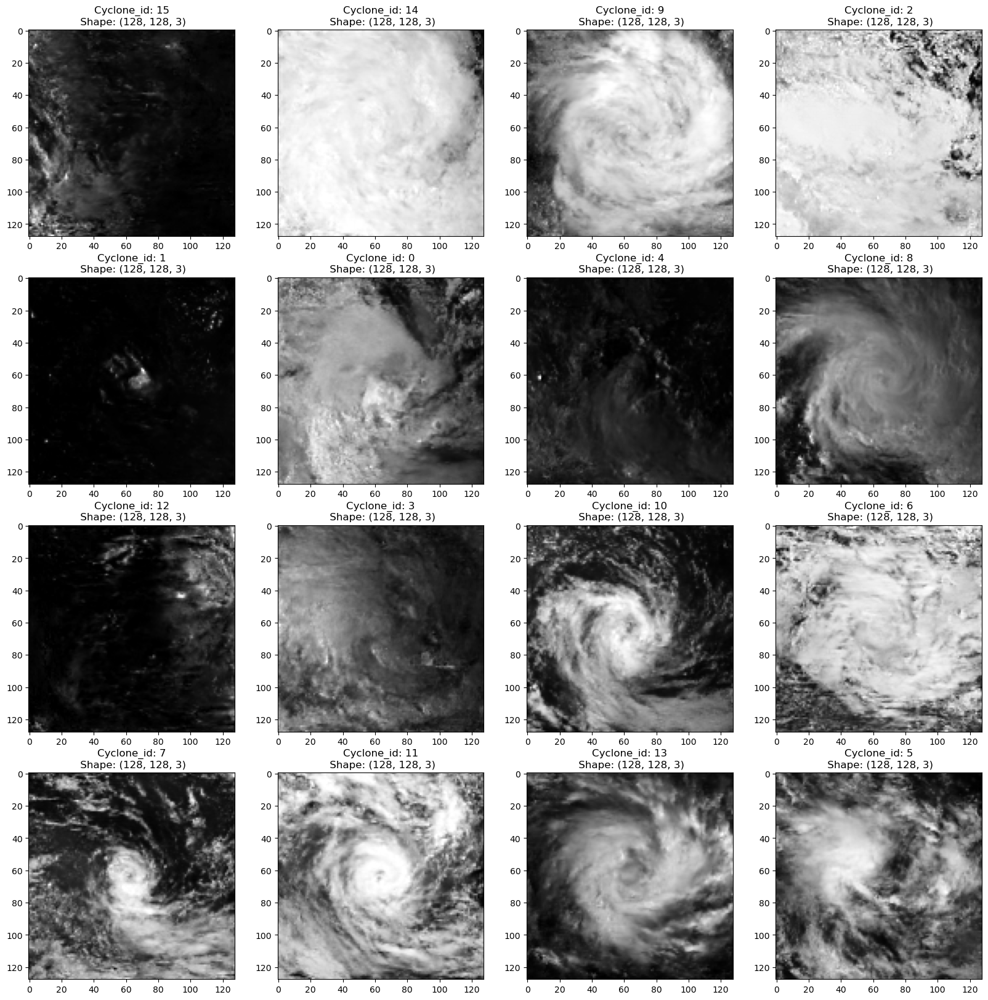

In [383]:
plot_random_cyclone(images.images)

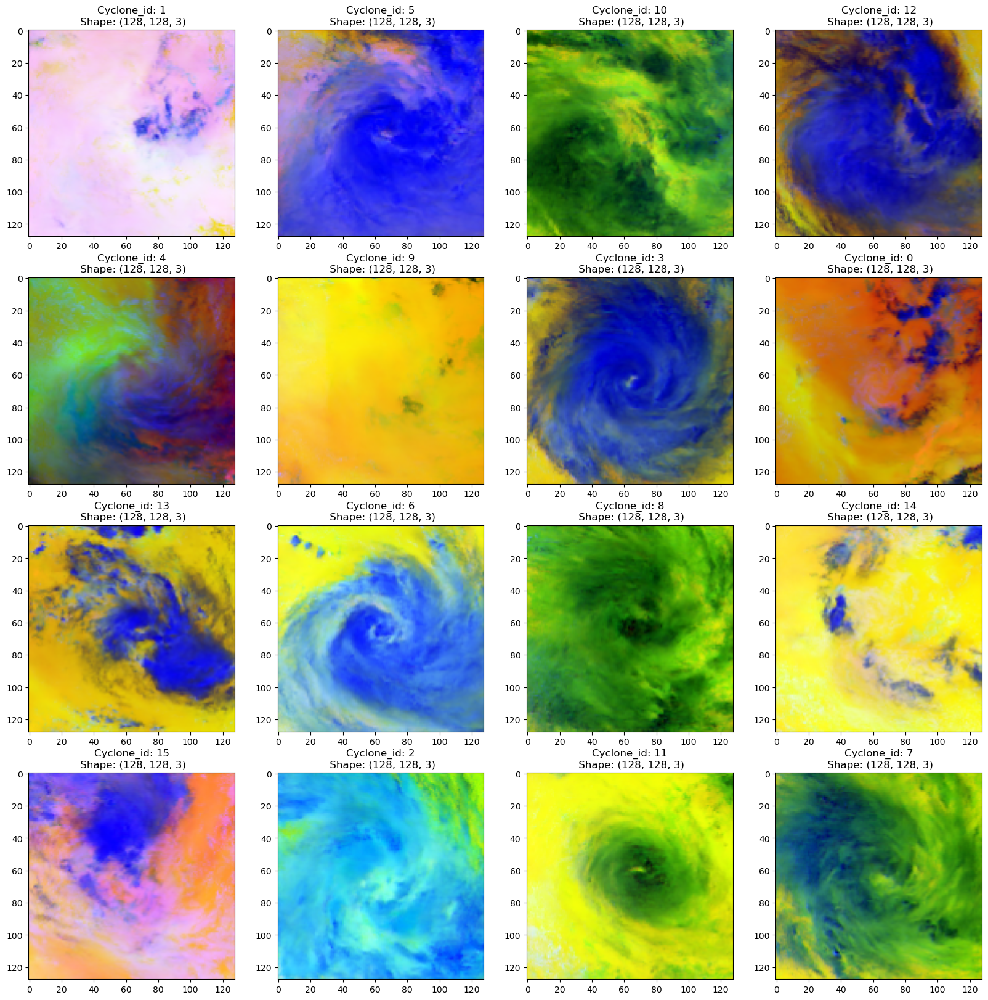

In [77]:
plot_random_cyclone(images.images)

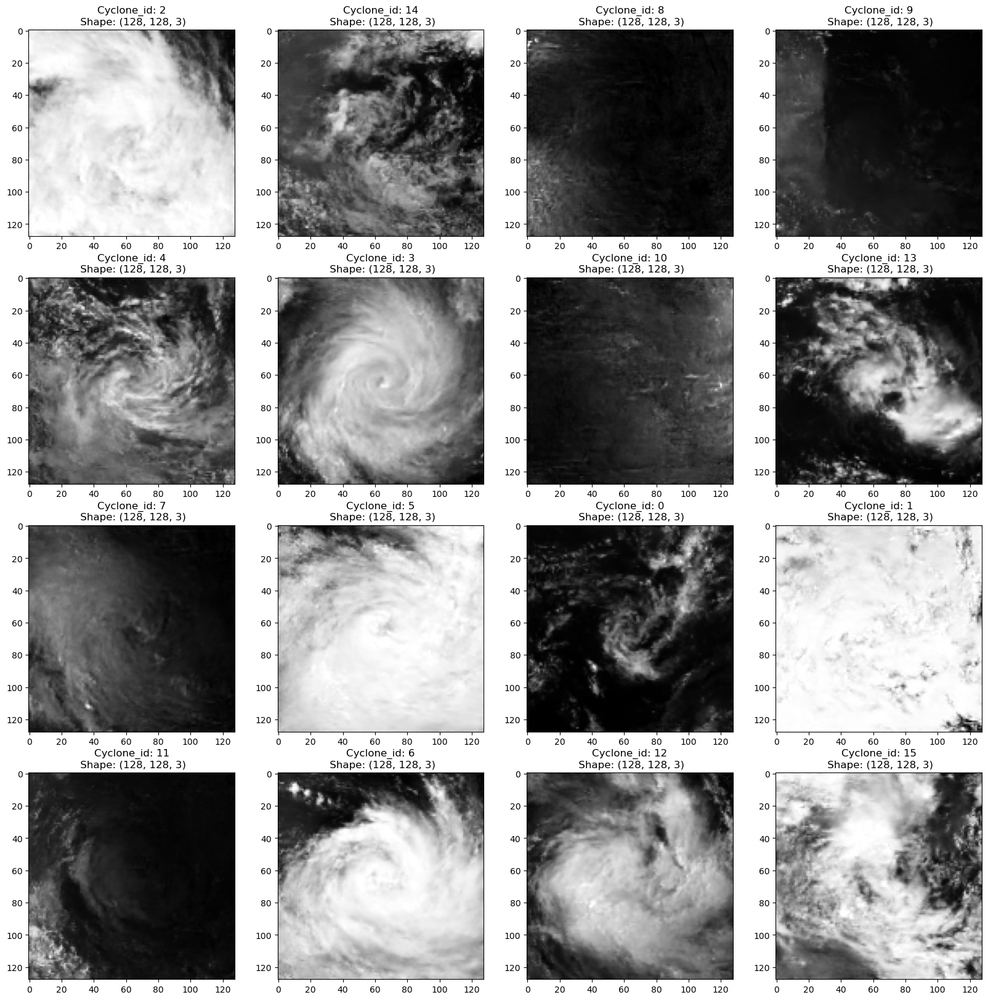

In [75]:
plot_random_cyclone(images.images)

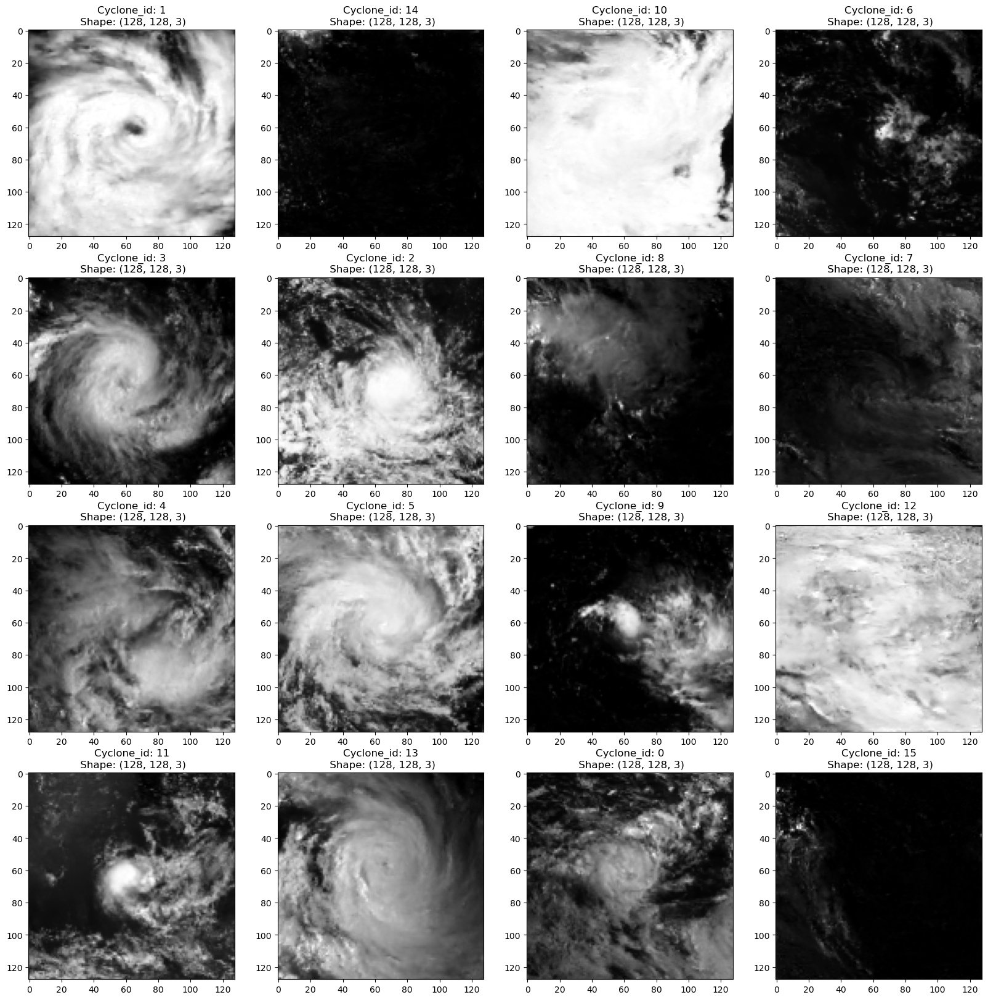

In [44]:
plot_random_cyclone(images.images)

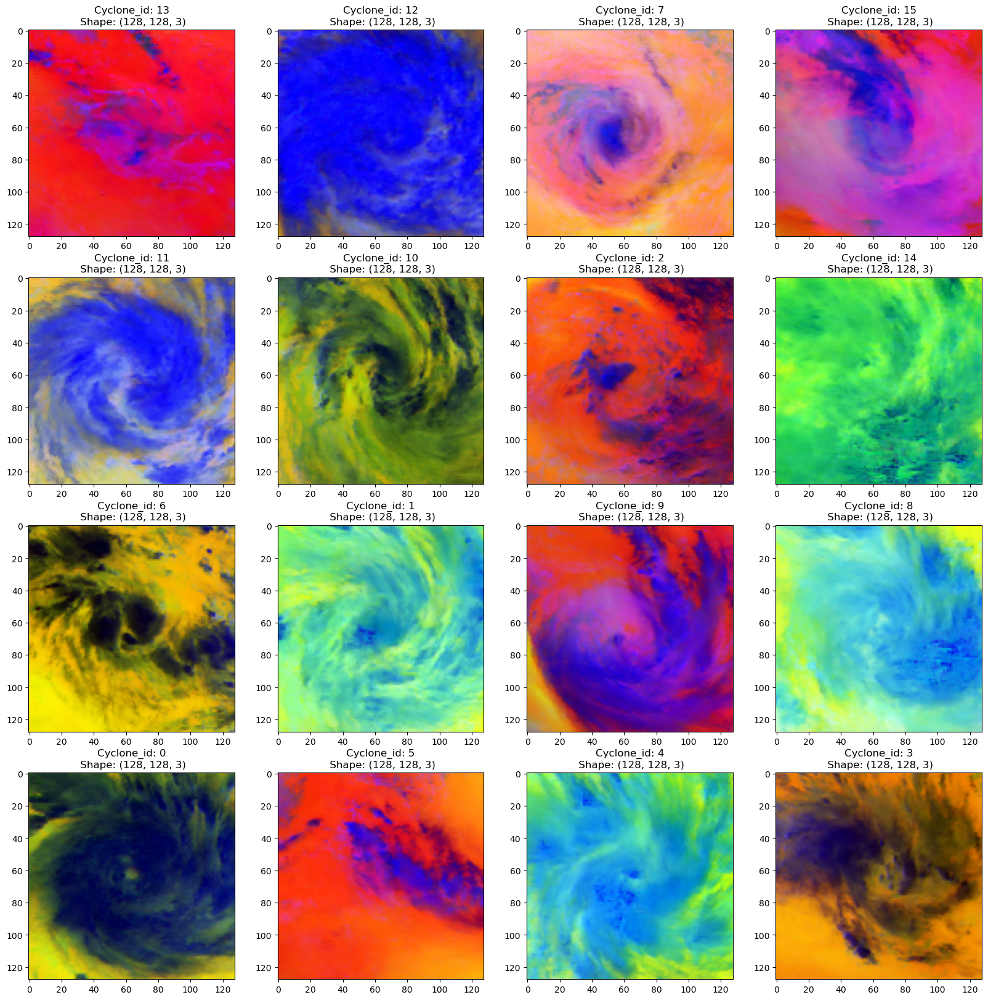

In [34]:
plot_random_cyclone(images.images)

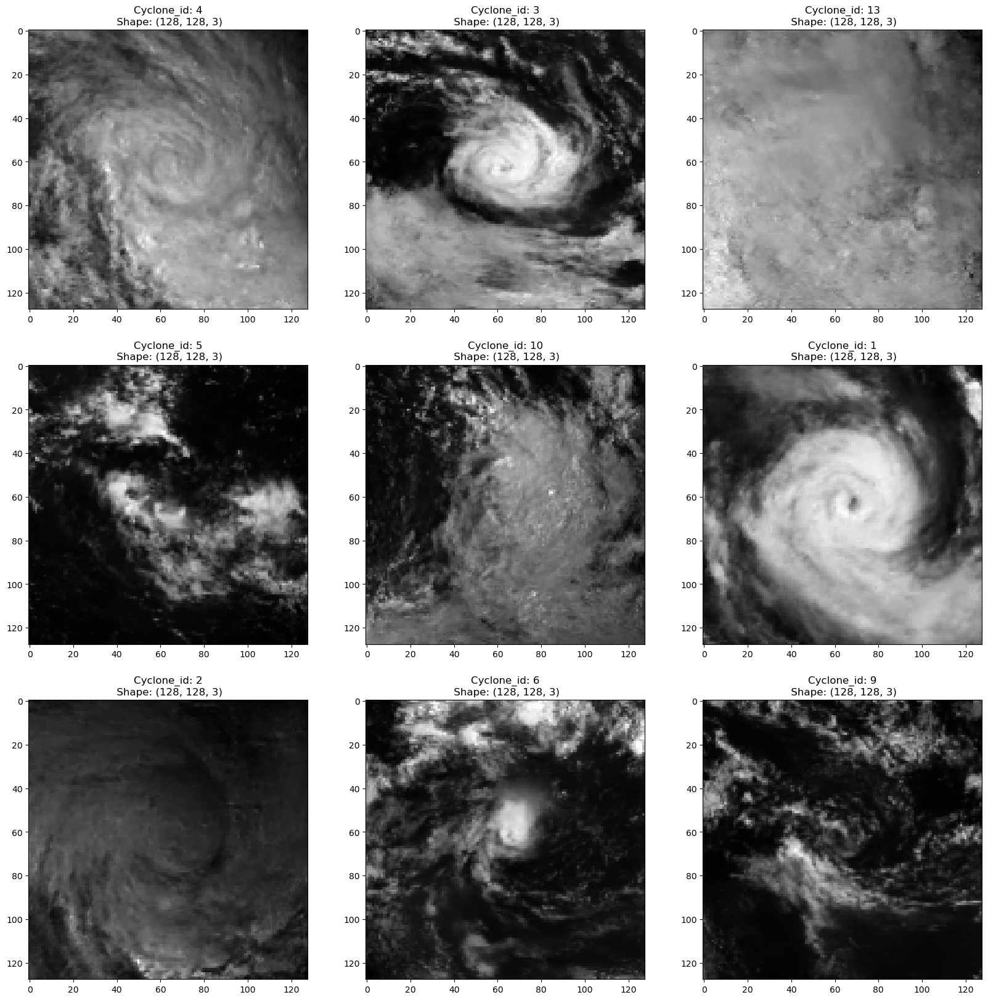

In [283]:
plot_random_cyclone(images.images)

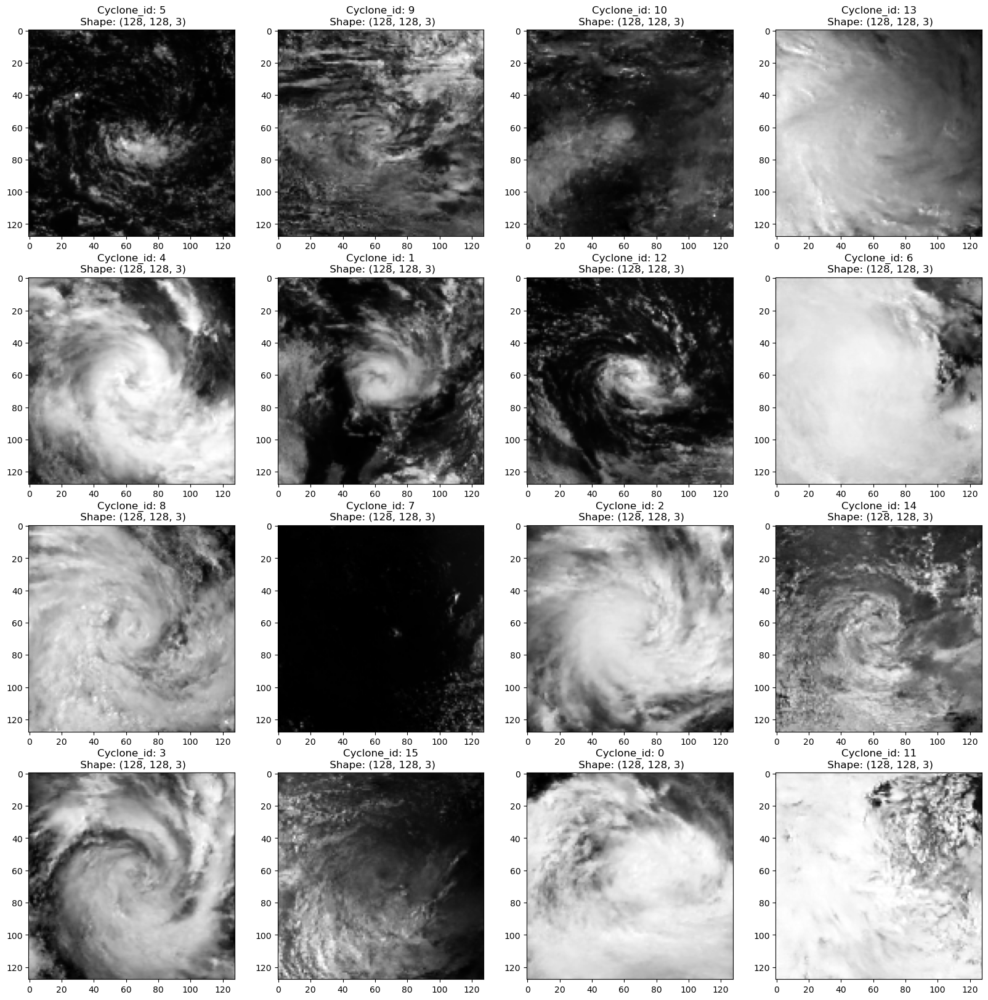

In [292]:
plot_random_cyclone(images.images)

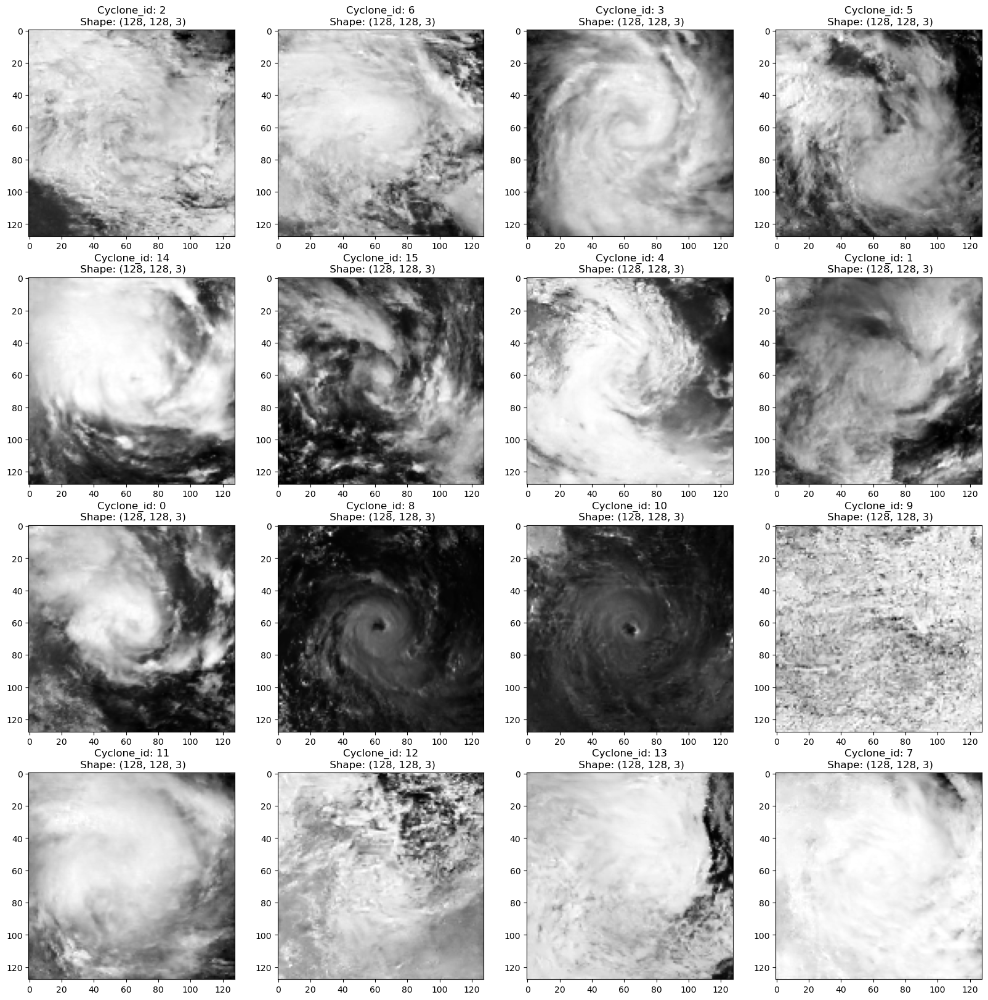

In [322]:
plot_random_cyclone(images.images)

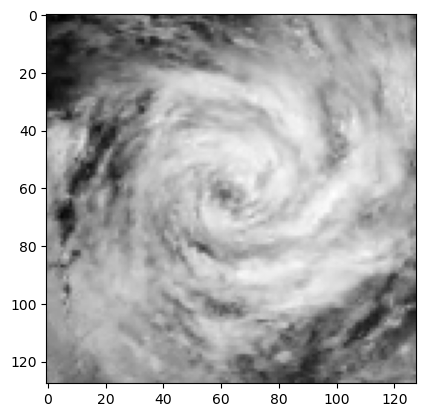

In [345]:
plt.imshow(np.array(images.images[1])[:,:, 2], cmap = "gray")

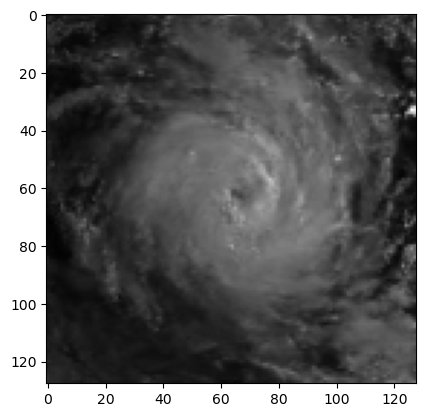

In [164]:
plt.imshow(np.array(images.images[3])[:,:,2], cmap = "gray")

torch.Size([128, 128, 3])
torch.Size([128, 128, 3])


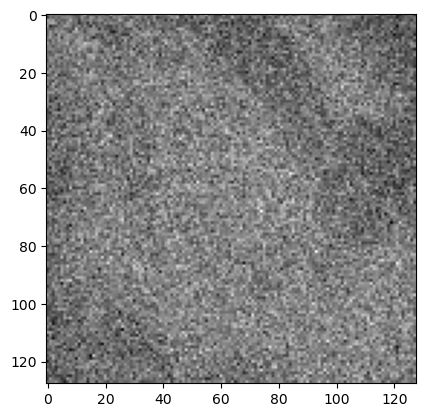

In [432]:
noise = torch.randn(torch.FloatTensor(np.array(images.images[4])).shape, device=torch.FloatTensor(np.array(images.images[4])).device)
bs = torch.tensor(np.array(images.images[4])).shape[0]
print(noise.shape)
timesteps = noise_scheduler.timesteps
noisy_image_0 = noise_scheduler.add_noise(torch.FloatTensor(np.array(images.images[4])), noise, torch.tensor(999, dtype = torch.int64).to(device))
print(noisy_image_0.shape)
plt.imshow(noisy_image_0[:,:,2], cmap = "gray")

torch.Size([128, 128, 3])
torch.Size([128, 128, 3])


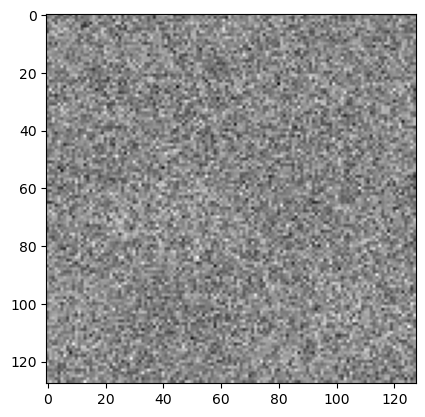

In [433]:
noise = torch.randn(torch.FloatTensor(np.array(images.images[10])).shape, device=torch.FloatTensor(np.array(images.images[10])).device)
bs = torch.tensor(np.array(images.images[3])).shape[0]
print(noise.shape)
timesteps = noise_scheduler.timesteps
noisy_image_1 = noise_scheduler.add_noise(torch.FloatTensor(np.array(images.images[10])), noise, torch.tensor(999, dtype = torch.int64).to(device))
print(noisy_image_1.shape)
plt.imshow(noisy_image_1[:,:,2], cmap = "gray")

In [483]:
z_interp_alt = z_interp.unsqueeze(0).permute(0,3,1,2)
z_interp_alt.shape

torch.Size([1, 3, 128, 128])

In [537]:
def Z_Interpolation_Images(seed_1 = 42, seed_2 = 69, steps = 10):
    alphas = np.linspace(0.0,1.0, num = steps)
    device = torch.device("cuda:0")
    latents_1 = torch.randn((1, 3, 128, 128), generator = torch.manual_seed(seed_1), device = torch.device("cpu")).to(device)
    latents_2 = torch.randn((1, 3, 128, 128), generator = torch.manual_seed(seed_2), device = torch.device("cpu")).to(device)
    images = []
    for alpha in alphas:
        z_code = alpha*latents_1 + (1.0 - alpha)*latents_2
        latents = z_code
        for t in tqdm(noise_scheduler.timesteps):
            with torch.no_grad():
                noisy_pred = model(latents, t).sample
            latents = noise_scheduler.step(noisy_pred, t, latents).prev_sample 

        image = (latents / 2 + 0.5).clamp(0, 1).squeeze()
        image = (image.permute(1, 2, 0) * 255).to(torch.uint8).cpu().numpy()
        image = (image * 255).round().astype("uint8")
        images.append(images)
    images = np.array(images)
    
    Figure, ax = plt.subplots(nrows=1,ncols = 10, figsize = (10,10))
    for index, image in enumerate(images):
        ax[index].imshow(image[:, :, 2], cmap = "gray")
        ax[index].title(f"Alpha: {index}")
    return Figure

In [538]:
Z_Interpolation_Images(seed_1 = 42, seed_2 = 69, steps = 10)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [456]:
latents_1 = torch.randn((1, 3, 128, 128), generator = torch.manual_seed(2), device = torch.device("cpu"))
latents_1.shape

torch.Size([1, 3, 128, 128])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


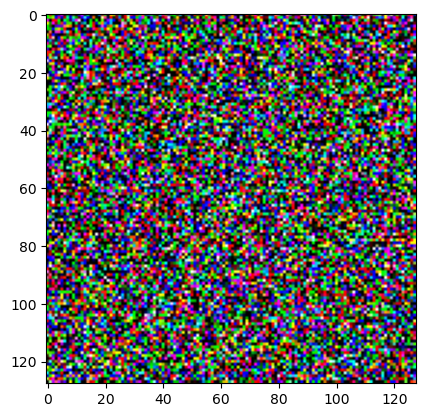

In [457]:
plt.imshow(latents_1.squeeze().permute(1,2,0), cmap = "gray")

In [458]:
latents_2 = torch.randn((1, 3, 128, 128), generator = torch.manual_seed(0), device = torch.device("cpu"))
latents_2.shape

torch.Size([1, 3, 128, 128])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


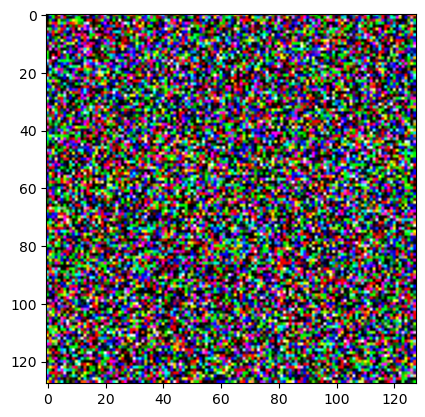

In [459]:
plt.imshow(latents_2.squeeze().permute(1,2,0), cmap = "gray")

In [520]:
alpha = 1.2
z_code = alpha*latents_1 + (1.0 - alpha)*latents_2
z_code.shape

torch.Size([1, 3, 128, 128])

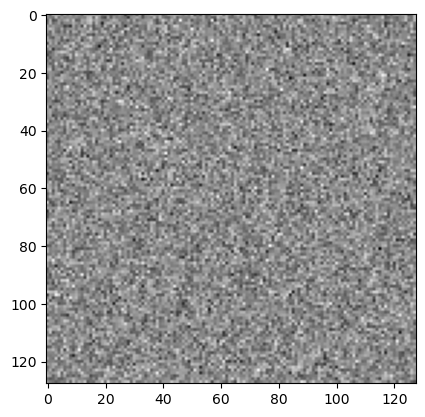

In [521]:
plt.imshow(z_code.squeeze().permute(1,2,0)[:,:,0], cmap = "binary")

In [197]:
unetts = accelerator.unwrap_model(model)
unetts

UNet2DModel(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): LoRACompatibleLinear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): LoRACompatibleLinear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): LoRACompatibleConv(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): LoRACompatibleLinear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): LoRACompatibleConv(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleLis

In [388]:
def Image_Generator(latents):    
    device = torch.device("cuda:0")
    latents = latents.to(device)
    for t in tqdm(noise_scheduler.timesteps):
        with torch.no_grad():
            noisy_pred = model(latents, t)[0]
        latents = noise_scheduler.step(noisy_pred, t, latents).prev_sample    
    image = (latents / 2 + 0.5).clamp(0, 1).squeeze()
    image = (image.permute(1, 2, 0) * 255).to(torch.uint8).cpu().numpy()
    image = (image * 255).round().astype("uint8")
    return image

In [454]:
def Z_Interpolation_Images(seed_1 = 88, seed_2 = 25, steps = 10):
    alphas = np.linspace(0.0,1.0, num = steps)
    device = torch.device("cuda:0")
    latents_1 = torch.randn((1, 3, 128, 128), generator = torch.manual_seed(seed_1), device = torch.device("cpu")).to(device)
    latents_2 = torch.randn((1, 3, 128, 128), generator = torch.manual_seed(seed_2), device = torch.device("cpu")).to(device)
    Figure, ax = plt.subplots(nrows=2,ncols = 5, figsize = (15,15))
    for index in range(len(alphas)):
        alpha = alphas[index]
        z_code = alpha*latents_1 + (1.0 - alpha)*latents_2
        latents = z_code
        image = Image_Generator(latents)
        if index < 5:
            ax[0, index] = plt.imshow(image[:, :, 2], cmap = "gray")
            #ax[0, index].set_title(f"Alpha: {alpha}")
        else:
            ax[1, index-5] = plt.imshow(image[:, :, 2], cmap = "gray")
            #ax[1, index-5].set_title(f"Alpha: {alpha}")
        plt.tight_layout()
    return Figure

  0%|          | 0/1000 [00:00<?, ?it/s]

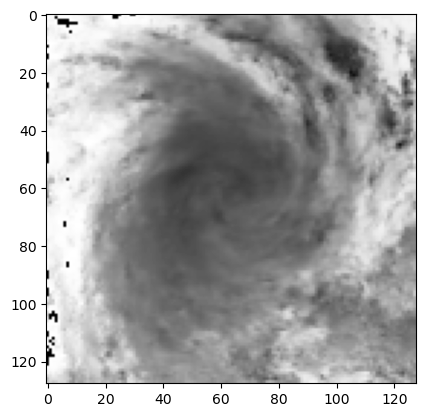

In [497]:
#Alpha 0.80
plt.imshow(Image_Generator(latents)[:,:,2], cmap = "gray")

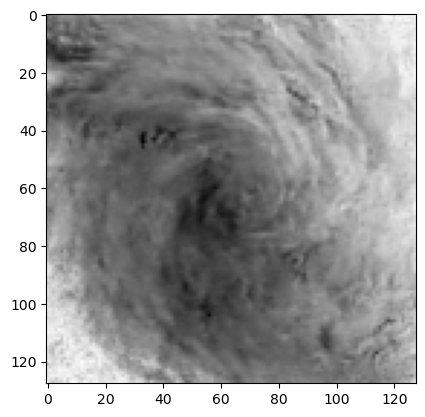

In [250]:
plt.imshow(image[:,:,2], cmap = "gray")